## Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math

## Reading data

Note that we dismiss Canary Islands, Balearic Islands Ceuta and Melilla because they are not considered in the demand data 

In [2]:
cities = pd.read_csv('cities_unified.csv', header = 0)
cities = cities[(cities['Provincias'] != 'Melilla') & (cities['Provincias'] != 'Ceuta') & (cities['Provincias'] != 'Santa Cruz de Tenerife') & (cities['Provincias'] != 'Palmas, Las') & (cities['Provincias'] != 'Balears, Illes')]
cities.reset_index(drop=True, inplace = True)
cities.tail()

,Codigos,Provincias,Latitud,Longitud,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
43,47,Valladolid,41.634126,-4.847191,529157,526288,523679,521130,519851,519546,520649,519361,517975,521333
44,48,Bizkaia,43.237680,-2.852600,1151905,1148775,1147576,1148302,1149628,1152651,1159443,1154334,1149344,1153282
45,49,Zamora,41.727174,-5.980539,185432,183436,180406,177404,174549,172539,170588,168725,167215,166927
46,50,Zaragoza,41.620365,-1.064497,960111,956006,950507,953486,954811,964693,972528,967452,966438,979365
47,0,TOTAL ESPAÑA,39.695119,-3.202023,46771341,46624382,46557008,46572132,46722980,47026208,47450795,47385107,47475420,48085361


In [3]:
ipc = pd.read_csv('IPC.csv', header = 0)
ipc = ipc[(ipc['Provincia'] != 'Melilla') & (ipc['Provincia'] != 'Ceuta') & (ipc['Provincia'] != 'Santa Cruz de Tenerife') & (ipc['Provincia'] != 'Palmas, Las') & (ipc['Provincia'] != 'Balears, Illes')]
ipc.reset_index(drop=True, inplace = True)
ipc.tail()

,Codigo,Provincia,1-2014,2-2014,3-2014,4-2014,5-2014,6-2014,7-2014,8-2014,...,3-2023,4-2023,5-2023,6-2023,7-2023,8-2023,9-2023,10-2023,11-2023,12-2023
43,47,Valladolid,93498,93451,93566,94419,94369,94419,93600,93776,...,111670,112360,112194,112770,112780,113328,113457,114086,113459,113537
44,48,Bizkaia,92529,92402,92640,93555,93525,93561,92738,92900,...,111128,111660,111744,112665,112700,113205,113485,113534,113198,113152
45,49,Zamora,93284,93234,93511,94390,94414,94352,93307,93525,...,113086,113937,113791,114536,114620,115011,115115,115517,114885,115055
46,50,Zaragoza,93588,93570,93708,94676,94661,94614,93792,93965,...,110967,111417,111269,111873,112310,112893,112907,113042,112828,112710
47,0,TOTAL ESPAÑA,93373,93333,93541,94373,94395,94421,93533,93681,...,111111,111773,111719,112354,112544,113149,113348,113676,113280,113308


In [4]:
ipc.columns

Index(['Codigo', 'Provincia', '1-2014', '2-2014', '3-2014', '4-2014', '5-2014',
       '6-2014', '7-2014', '8-2014',
       ...
       '3-2023', '4-2023', '5-2023', '6-2023', '7-2023', '8-2023', '9-2023',
       '10-2023', '11-2023', '12-2023'],
      dtype='object', length=122)

In [5]:
demanda_meteo = pd.read_csv('demanda_meteo.csv', header = 0)
demanda_meteo['Datetime'] = pd.to_datetime(demanda_meteo['Datetime'])
demanda_meteo.head()

,Datetime,Demanda Real,Demanda Prevista,Demanda Programada,Demanda D+1,Precio,temperature_2m_1,direct_normal_irradiance_instant_1,wind_speed_100m_1,temperature_2m_2,...,wind_speed_100m_50,temperature_2m_51,direct_normal_irradiance_instant_51,wind_speed_100m_51,temperature_2m_52,direct_normal_irradiance_instant_52,wind_speed_100m_52,temperature_2m_0,direct_normal_irradiance_instant_0,wind_speed_100m_0
0,2014-01-01 00:00:00,24301.66667,23878.33333,24099.0,0.0,37.21,7.4985,0.0,16.099690,7.874,...,30.758411,11.714001,0.0,17.339897,10.032000,0.0,11.659777,5.791485,0.0,18.565381
1,2014-01-01 01:00:00,23365.33333,23322.00000,22269.0,0.0,30.57,7.0485,0.0,17.388409,7.724,...,30.312773,11.614000,0.0,18.000000,9.731999,0.0,10.661107,5.709594,0.0,18.443398
2,2014-01-01 02:00:00,21672.50000,21711.16667,21136.0,0.0,26.30,7.3985,0.0,19.319628,7.574,...,27.792374,11.564000,0.0,17.651016,9.932000,0.0,11.212135,5.620734,0.0,18.401250
3,2014-01-01 03:00:00,20192.00000,20230.33333,19911.0,0.0,26.18,7.3485,0.0,20.140705,7.424,...,25.772078,11.464001,0.0,18.430452,10.432000,0.0,12.620554,5.597380,0.0,18.198554
4,2014-01-01 04:00:00,19220.66667,19215.33333,19060.0,0.0,22.40,7.4985,0.0,21.995380,7.374,...,23.732710,11.464001,0.0,18.161278,10.582000,0.0,14.058450,5.656951,0.0,18.100382


In [6]:
festivos = pd.read_csv('Festivos.csv', header = 0)
festivos['Day'] = pd.to_datetime(festivos['Day'])
festivos = festivos.drop(['Melilla', 'Ceuta', 'Santa Cruz de Tenerife', 'Palmas, Las', 'Balears, Illes'], axis = 1)
festivos.head()

,Day,Day of the week,"Coruña, A",Albacete,Alicante/Alacant,Almería,Araba/Álava,Asturias,Badajoz,Barcelona,...,Soria,Tarragona,Teruel,Toledo,Valencia/València,Valladolid,Zamora,Zaragoza,Ávila,sumafest
0,2014-01-01,X,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1.000000
1,2014-01-02,J,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.019659
2,2014-01-03,V,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
3,2014-01-04,S,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.000000
4,2014-01-05,D,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1.000000


In [7]:
pib = pd.read_csv('PIB.csv', header = 0)
pib.head()

,Codigo,Provincia,1-2014,2-2014,3-2014,4-2014,5-2014,6-2014,7-2014,8-2014,...,3-2023,4-2023,5-2023,6-2023,7-2023,8-2023,9-2023,10-2023,11-2023,12-2023
0,0,TOTAL ESPAÑA,925468,925468,925468,969598,969598,969598,960418,960418,...,1099141,1139036,1139036,1139036,1127405,1127405,1127405,1171293,1171293,1171293


## X and Y creation and definition of the metrics

In [8]:
años_train = 8
años_validation = 1
años_test = 10 - años_train - años_validation

start_year = 2014
days_year = [365,365,366,365,365,365,366,365,365,365]
days_month = [31,28,31,30,31,30,31,31,30,31,30,31]
days_bisiesto = [31,29,31,30,31,30,31,31,30,31,30,31]

days_training = sum (days_year[:años_train]) - 7
hours_training = 24*days_training - 168
print (hours_training)

days_validation = sum (days_year[años_train:años_train+años_validation]) 
hours_validation = 24*days_validation 
print (hours_validation)

days_testing = sum(days_year[años_train+años_validation:])
hours_testing = 24*days_testing
print (hours_testing)

69792
8760
8760


In [9]:
x = {i:[] for i in range (24)}
x_train = {i:[] for i in range (24)}
x_val = {i:[] for i in range (24)}
x_test = {i:[] for i in range (24)}
y = {i:[] for i in range (24)}
y_train = {i:[] for i in range (24)}
y_val = {i:[] for i in range (24)}
y_test = {i:[] for i in range (24)}
prevision = {i:[] for i in range (24)}
prevision_train = {i:[] for i in range (24)}
prevision_val = {i:[] for i in range (24)}
prevision_test = {i:[] for i in range (24)}

In [10]:
provincias = cities['Provincias'][:-1]

In [11]:
flag = 0
for i in range (len(festivos)):
    suma = 0
    cont = 0
    sumapob = sum(cities[str(festivos['Day'][i].year)][:-1])
    for name in provincias:
        auxsum = festivos[name][i]*cities.loc[cities['Provincias'] == name][str(festivos['Day'][i].year)][cont]
        suma += auxsum
        cont += 1
    #print (suma/sumapob)
    sumafest = suma/sumapob
    for h in range (24):
        try:
            aux = []
            aux.append(festivos['Day'][i].day)
            aux.append(festivos['Day'][i].month)
            for j in range (7):
                if festivos['Day'][i].weekday() == j:
                    aux.append(1)
                else:
                    aux.append(0)
            aux.append(sumafest)
            aux.append(ipc[str(festivos['Day'][i].month)+'-'+str(festivos['Day'][i].year)][47])
            aux.append(pib[str(festivos['Day'][i].month)+'-'+str(festivos['Day'][i].year)][0])
#             aux.append(demanda_meteo['Precio'][24*(i-2)+h])
            aux.append(demanda_meteo['temperature_2m_0'][24*i+h])
            aux.append(demanda_meteo['Demanda Real'][24*(i-1)+h])
            aux.append(demanda_meteo['temperature_2m_0'][24*(i-1)+h])
            aux.append(demanda_meteo['Demanda Real'][24*(i-7)+h])
            
#             print (aux)
            
        except:
            continue
    
        if int (festivos['Day'][i].year) - start_year < años_train:
            if flag == 0:
                print (24*i+h)
                flag = 1
            x_train[h].append(np.array(aux))
            y_train[h].append(demanda_meteo['Demanda Real'][24*(i)+h])
            prevision_train[h].append(demanda_meteo['Demanda Prevista'][24*(i)+h])
        
        elif int (festivos['Day'][i].year) - start_year >= años_train and int (festivos['Day'][i].year) - start_year < años_train + años_validation:
            if flag == 1:
                print (24*i+h)
                flag = 2
            x_val[h].append(np.array(aux))
            y_val[h].append(demanda_meteo['Demanda Real'][24*(i)+h])
            prevision_val[h].append(demanda_meteo['Demanda Prevista'][24*(i)+h])
        
        else:
            if flag == 2:
                print (24*i+h)
                flag = 3
            x_test[h].append(np.array(aux))
            y_test[h].append(demanda_meteo['Demanda Real'][24*(i)+h])
            prevision_test[h].append(demanda_meteo['Demanda Prevista'][24*(i)+h])
        
        x[h].append(np.array(aux))
        y[h].append(demanda_meteo['Demanda Real'][24*(i)+h])
        prevision[h].append(demanda_meteo['Demanda Prevista'][24*(i)+h])

len(x)

168
70128
78888


24

In [12]:
def metrics (preds, val):
    df = {}
    combined_df = pd.DataFrame()
    overall = []
    for h in range (24):
        aux = {}
        auxpreds = np.array(preds[h])
        auxval = np.array(val[h])
#         datetest = base[h]
        aux['Datetime'] = demanda_meteo[(demanda_meteo['Datetime'].dt.year - start_year - años_train - años_validation < años_test) & (demanda_meteo['Datetime'].dt.year - start_year - años_train - años_validation >= 0) & (demanda_meteo['Datetime'].dt.hour == h)]['Datetime']
        aux['Error'] = auxpreds-auxval
        aux['Absolute Error'] = abs(aux['Error'])
        aux['Squared Error'] = (auxpreds-auxval)*(auxpreds-auxval)
        aux['Relative Error'] = 100*abs((auxpreds-auxval)/auxval)
        
#         print([[name, len(aux[name])] for name in aux.keys()])
        df[h] = pd.DataFrame(aux)
#         df[h]['Datetime'] = pd.to_datetime(df[h]['Datetime'], format='%d-%m-%Y') + pd.DateOffset(hours=h)
        df[h]['Datetime'] = pd.to_datetime(df[h]['Datetime'])
        combined_df = pd.concat((combined_df, df[h]))
        overall.append([np.sqrt(np.mean(df[h]['Error']*df[h]['Error'])), np.mean(df[h]['Absolute Error']), np.mean(df[h]['Relative Error']), max(df[h]['Absolute Error'])])
        
    result = np.mean(np.array(overall), axis=0)
    # Assuming your dictionary is named 'data_dict'
    # Concatenate dataframes from the dictionary into one large dataframe
#     combined_df = pd.concat([d.assign(datetime=pd.to_datetime(df['Datetime'], format='%d-%m-%Y') + pd.DateOffset(hours=hour)) 
#                              for hour, d in df.items()])
#     combined_df = pd.concat([d for d in df.items()])

    # Sort the dataframe by the datetime column
    combined_df = combined_df.sort_values(by='Datetime')

    # Convert datetime column to the desired format (day-month-year hour)
#     combined_df['Datetime'] = combined_df['Datetime'].dt.strptime(combined_df['Datetime'], '%Y-%m-%d %H:%M:%S')

    # Optionally, reset index if needed
    combined_df = combined_df.reset_index(drop=True)

    # Now, combined_df contains the concatenated and sorted dataframe with the desired datetime format,
    # where the hour comes from the key of the dictionary
    
    return combined_df,result
#     return combined_df

## Linear Regression

In [13]:
from sklearn.linear_model import LinearRegression

linear_models = {}
linear_predictions = {}

for h in range (24):
    linear_models[h] = LinearRegression().fit(x_train[h], y_train[h])
    linear_predictions[h] = linear_models[h].predict(x_test[h])

In [14]:
df_linear, linear_metrics = metrics(linear_predictions, y_test)
linear_metrics

array([9.45552000e+02, 6.88070427e+02, 2.60591742e+00, 4.26687416e+03])

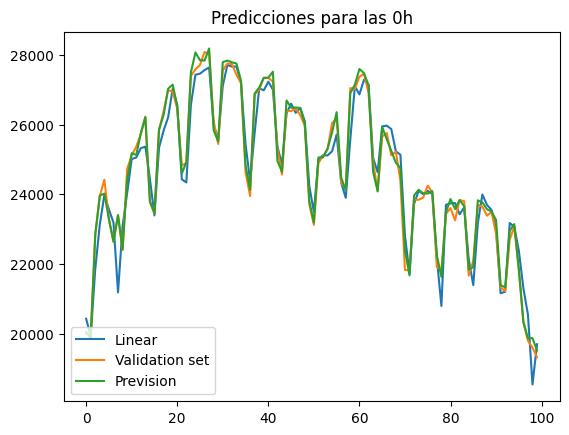

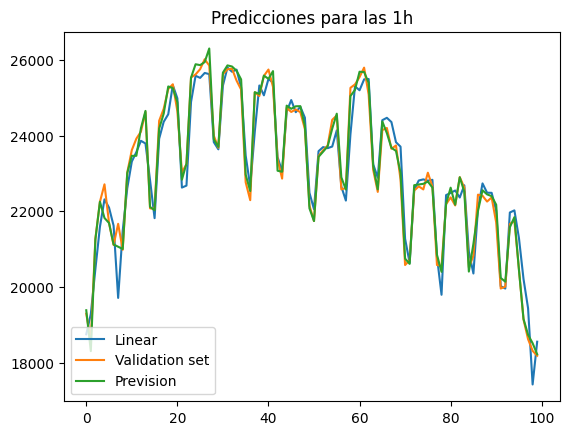

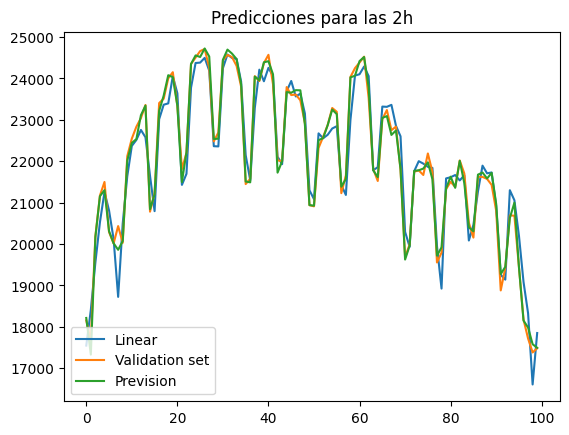

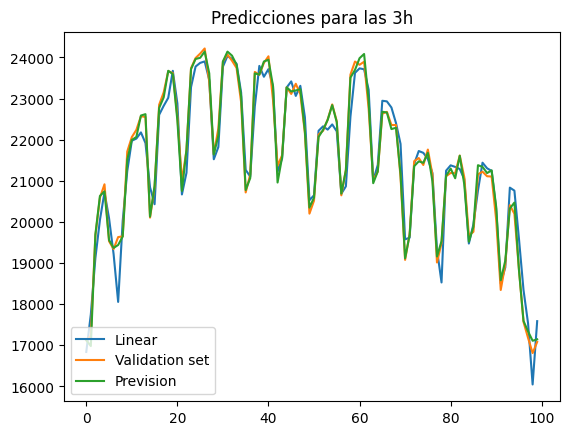

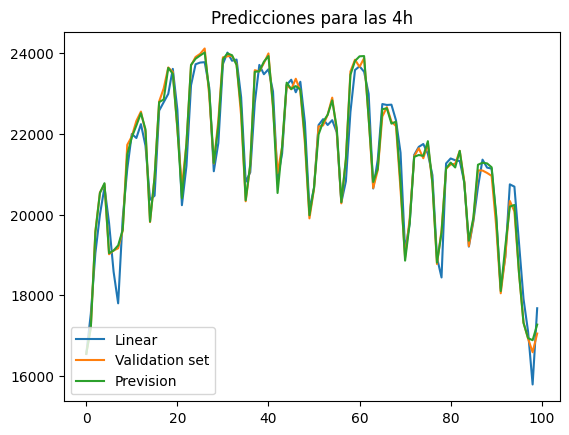

...

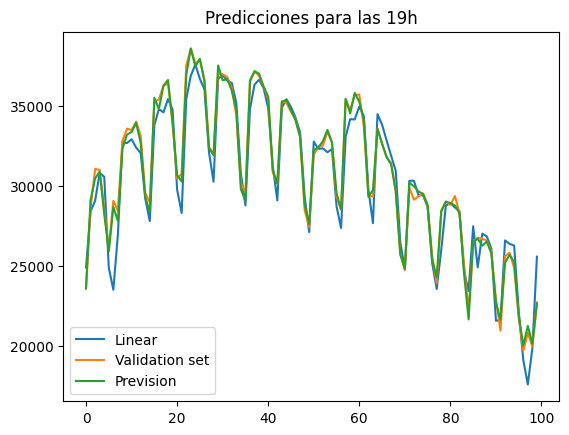

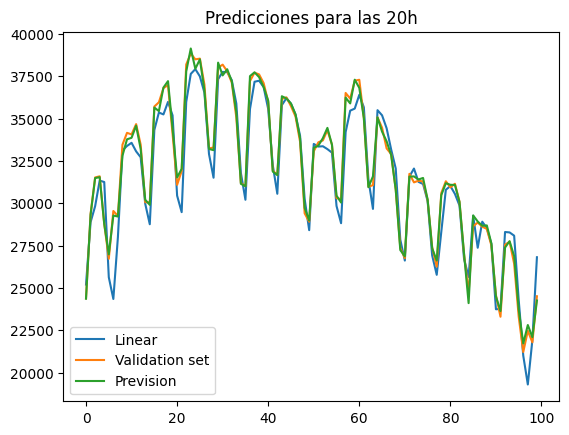

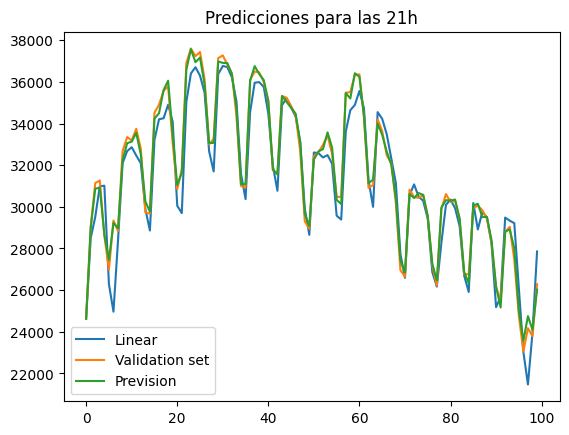

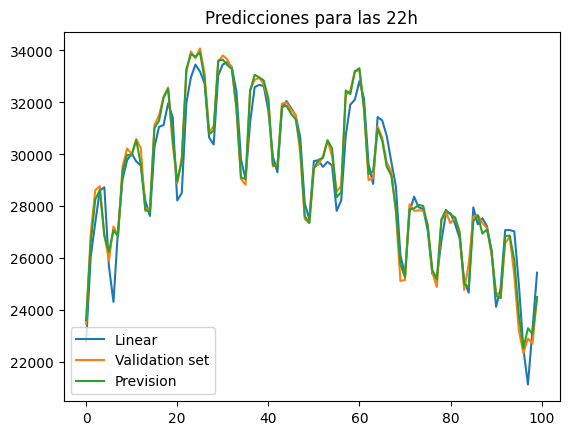

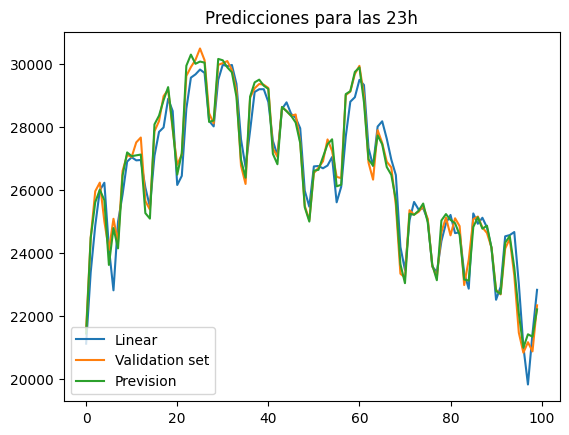

In [15]:
for h in range (24):
    plt.title ('Predicciones para las ' +  str(h) +  'h')
    plt.plot(linear_predictions[h][:100], label = 'Linear')
    plt.plot(y_test[h][:100], label = 'Validation set')
    plt.plot(prevision_test[h][:100], label = 'Prevision')
    plt.legend(loc='lower left')
    plt.show()

## XGBoost

In [16]:
from xgboost.sklearn import XGBRegressor

XGB_models = {}
XGB_predictions = {}

for h in range (24):
    XGB_models[h] = XGBRegressor().fit(x_train[h]+x_val[h], y_train[h]+y_val[h])
    XGB_predictions[h] = XGB_models[h].predict(x_test[h])

In [17]:
df_XGB, XGB_metrics = metrics(XGB_predictions, y_test)
XGB_metrics

array([8.56240287e+02, 6.39522360e+02, 2.48357512e+00, 4.04023440e+03])

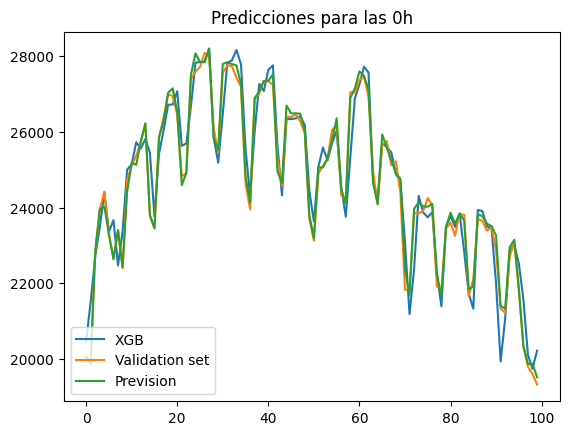

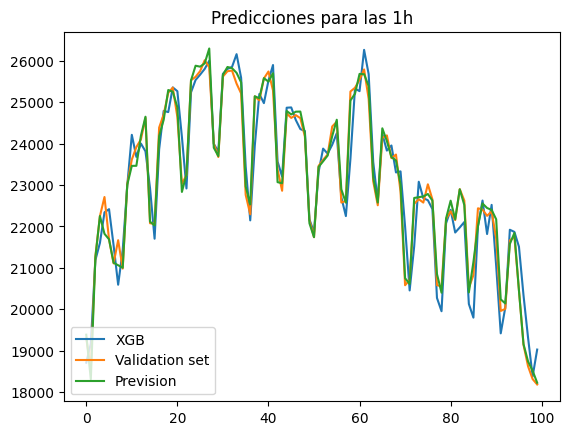

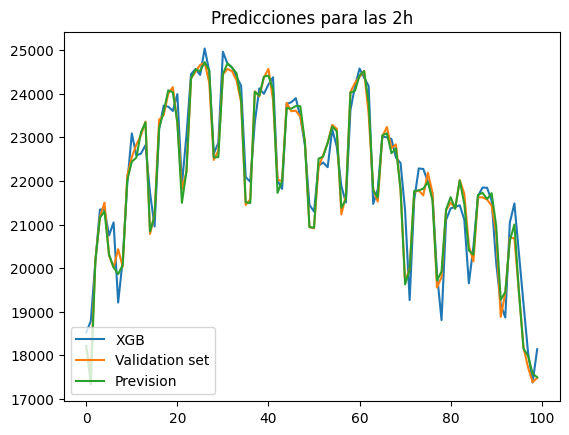

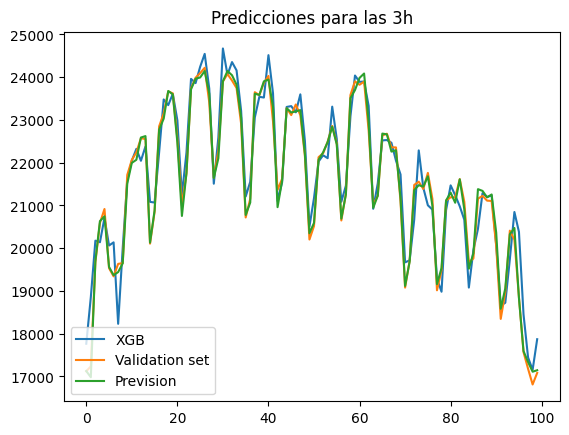

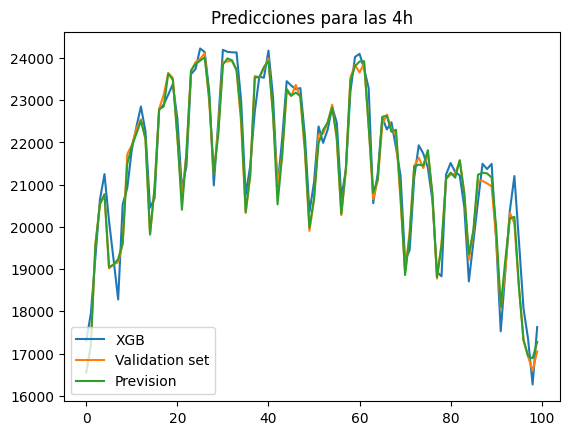

...

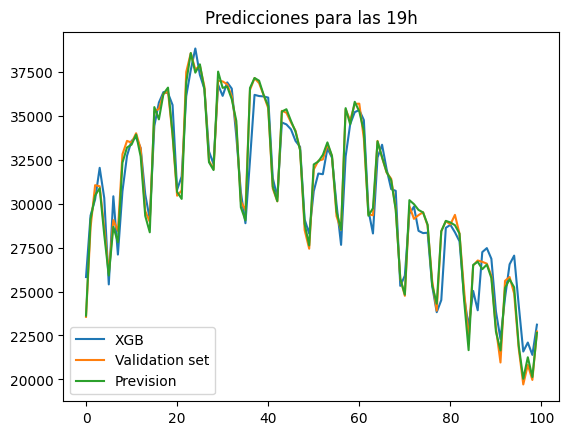

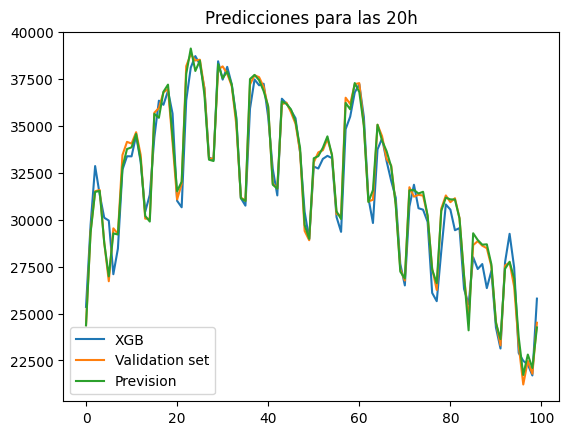

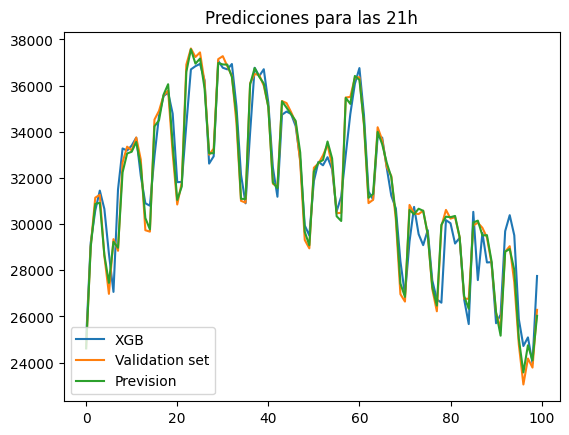

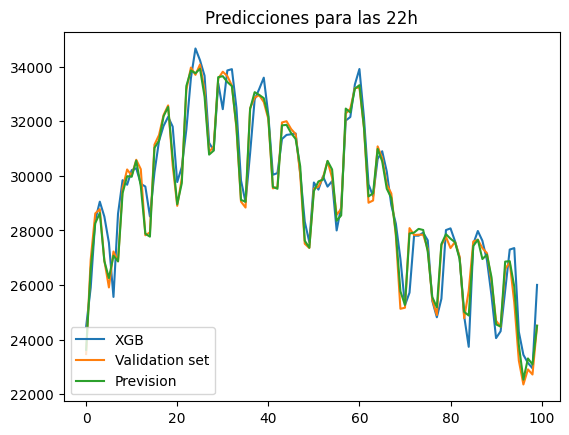

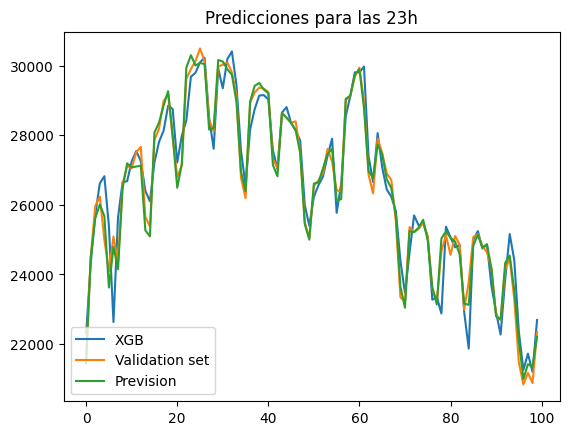

In [18]:
for h in range (24):
    plt.title ('Predicciones para las ' +  str(h) +  'h')
    plt.plot(XGB_predictions[h][:100], label = 'XGB')
    plt.plot(y_test[h][:100], label = 'Validation set')
    plt.plot(prevision_test[h][:100], label = 'Prevision')
    plt.legend(loc='lower left')
    plt.show()

## Regressive Models

In [19]:
lags = [i for i in range (1,15)]

### Autoregressive

In [20]:
def predict_ar (model, y_, start, npreds, lags=lags):
    cont = 0
    preds_list = []
    coef = np.array(model.params)
    while cont < npreds:
        
        aux = np.zeros(len(lags))
        
        for i,l in enumerate(lags):
            aux[i] = y_[start+cont-l]

        preds = sum (coef[1:]*aux) + coef[0]

        preds_list.append(preds)

        cont += 1
    
    return preds_list

In [21]:
from statsmodels.tsa.ar_model import AutoReg

AR_model = {}

for h in range (24):
    AR_model[h] = AutoReg(y_train[h] + y_val[h], lags=lags).fit()
    # print('Coefficients: %s' % AR_model[h].params)

In [22]:
AR_predictions = {}

for h in range (24):
    AR_predictions[h] = predict_ar (AR_model[h], y[h], len(y_train[h]+y_val[h]), len(y_test[h]))

In [23]:
df_AR, AR_metrics = metrics(AR_predictions, y_test)
AR_metrics

array([1.26345588e+03, 8.67268005e+02, 3.35245523e+00, 6.73501908e+03])

### LGBM

In [24]:
def predict (forecaster, y_, start, npreds, lags = lags, steps = 1):
    cont = 0
    preds_list = []
    start_window = start-max(lags)
    end_window = start
    while cont < npreds:
        window = pd.Series(y_[start_window:end_window])

        preds = forecaster.predict(steps=steps,last_window=window)

        preds_list.append(list(preds))

        cont += steps
        start_window += steps
        end_window += steps

    predictions = [item for sublist in preds_list for item in sublist]
    
    return predictions

In [25]:
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from lightgbm import LGBMRegressor

forecaster = {}
AR_XGB_predictions = {}

for h in range (24):

    # Crear el forecaster
    # ==============================================================================
    forecaster[h] = ForecasterAutoreg(
                     regressor = LGBMRegressor(verbose=-1),
                     lags = lags
                 )

    # Entrena el forecaster
    # ==============================================================================
    forecaster[h].fit(y=pd.Series(y_train[h]+y_val[h]))
    AR_XGB_predictions [h] = predict (forecaster[h], pd.Series(y[h]), len(y_train[h]+y_val[h]), len(y_test[h]))
    

In [26]:
df_AR_XGB, AR_XGB_metrics = metrics(AR_XGB_predictions, y_test)
AR_XGB_metrics

array([1.22916281e+03, 8.54513172e+02, 3.35453106e+00, 6.67744626e+03])

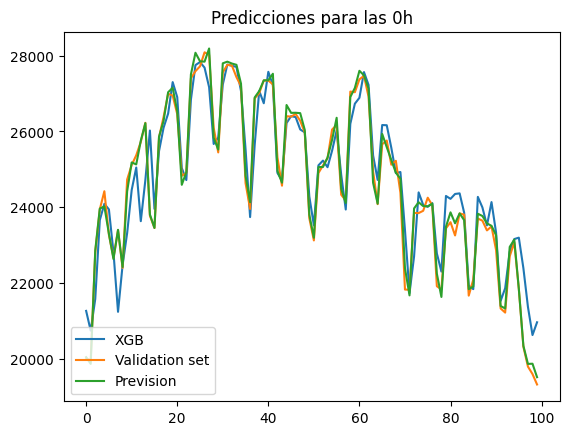

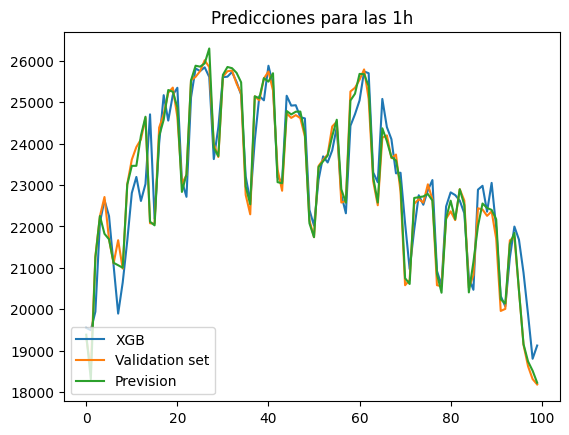

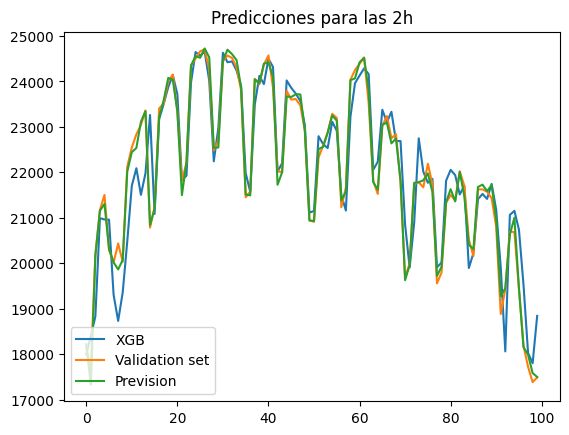

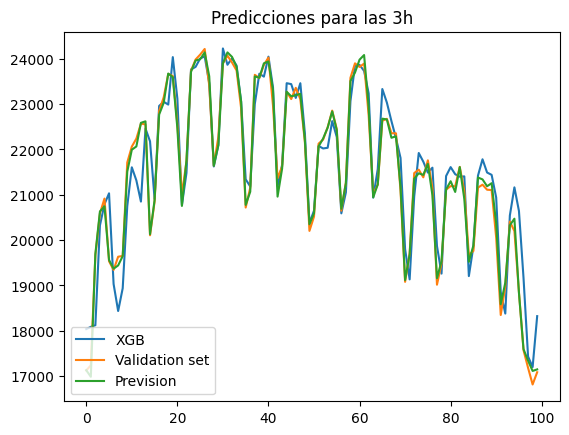

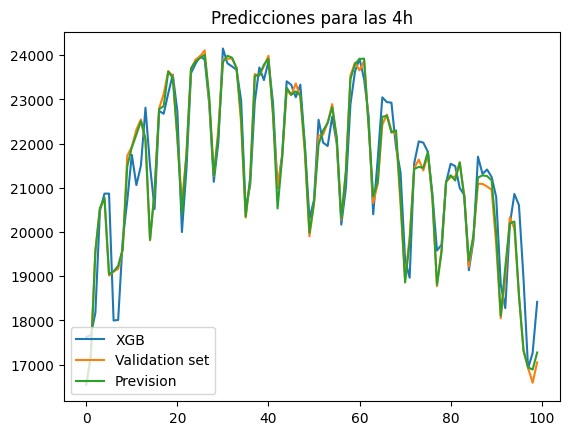

...

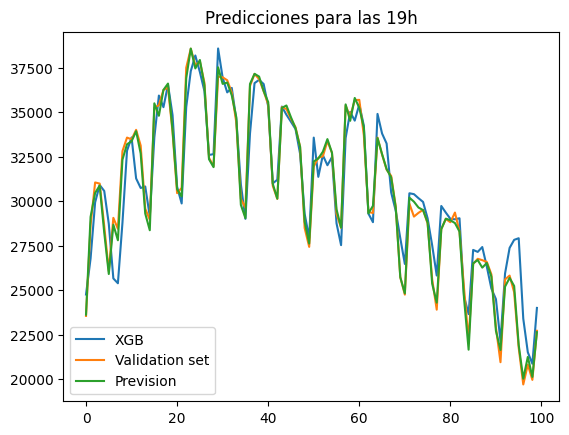

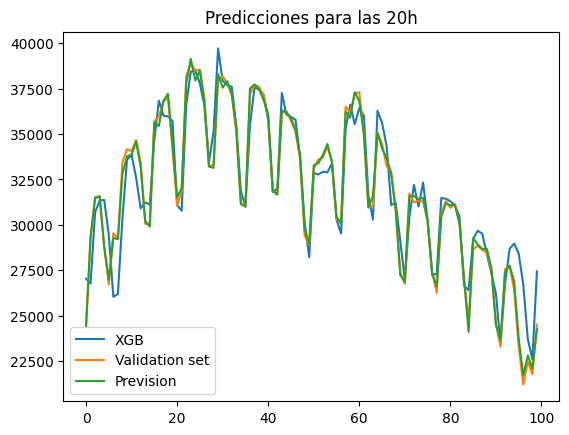

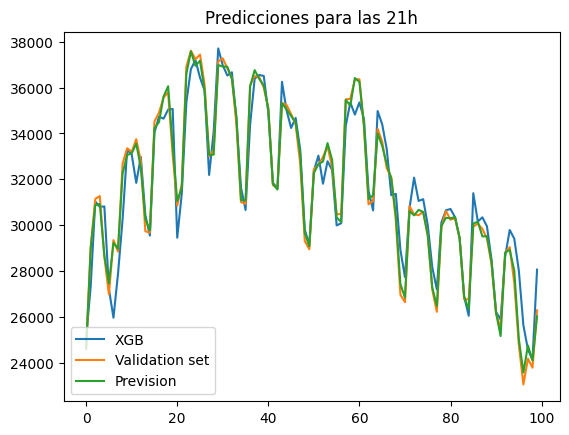

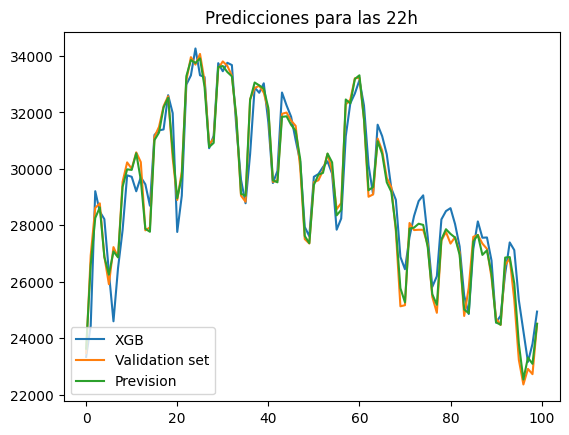

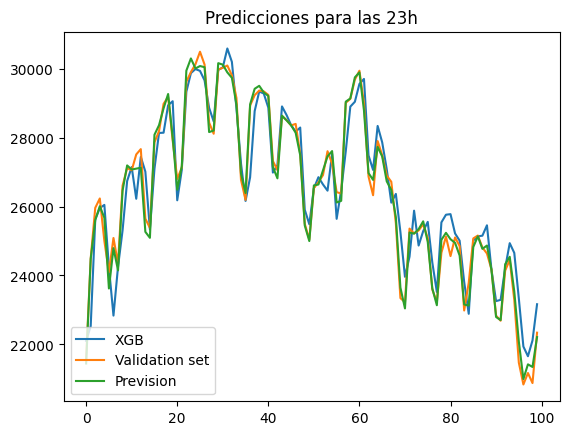

In [27]:
for h in range (24):
    plt.title ('Predicciones para las ' +  str(h) +  'h')
    plt.plot(AR_XGB_predictions[h][:100], label = 'XGB')
    plt.plot(y_test[h][:100], label = 'Validation set')
    plt.plot(prevision_test[h][:100], label = 'Prevision')
    plt.legend(loc='lower left')
    plt.show()

## NN

In [28]:
! pip install keras

In [29]:
import keras
from keras import layers

input_shape = len(x_train[0][0])
output_shape = 1

models_1 = {}

for h in range (24):

    models_1[h] = keras.Sequential(
        [
            keras.Input(shape=input_shape),
            layers.Dense(16, activation='relu'),
            layers.Dense(8, activation="linear"),
            layers.Dense(output_shape, activation="linear"),
        ]
    )

tensorflow WARNING From C:\Users\david\.anaconda\envs\tfm2\lib\site-packages\keras\src\losses.py:2976: The name tf.losses.sparse_softmax_cross_entropy is deprecated. Please use tf.compat.v1.losses.sparse_softmax_cross_entropy instead.

tensorflow WARNING From C:\Users\david\.anaconda\envs\tfm2\lib\site-packages\keras\src\backend.py:1398: The name tf.executing_eagerly_outside_functions is deprecated. Please use tf.compat.v1.executing_eagerly_outside_functions instead.



In [30]:
from tensorflow import keras
from keras import layers

input_shape = len(x_train[0][0])
output_shape = 1

models = {}

for h in range (24):

    models[h] = keras.Sequential(
        [
            keras.Input(shape=input_shape),
            layers.Dense(16, activation='relu'),
            layers.Dense(8, activation="linear"),
            layers.Dense(output_shape, activation="linear"),
        ]
    )

In [31]:
batch_size = 256
epochs = 500

from keras import backend as K
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import ModelCheckpoint

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mean_absolute_error(y_true, y_pred):
        return (K.mean(abs(y_pred - y_true)))

def maximum_error(y_true, y_pred):
    return (K.max(abs(y_pred - y_true)))

history = {}
NN_predictions_1 ={}

class PrintMetrics(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch == (self.params['epochs'] - 1):
            print('Metrics for the last epoch:')
            for key, value in logs.items():
                print(f'{key}: {value}')
            print('\n')
            
class BestWeightsCallback(Callback):
    def __init__(self, monitor='val_accuracy', mode='max'):
        super(BestWeightsCallback, self).__init__()
        self.monitor = monitor
        self.mode = mode
        self.best_weights = None
        self.best = -float('inf') if mode == 'max' else float('inf')

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get(self.monitor)
        if current is None:
            return
        
        if (self.mode == 'max' and current > self.best) or (self.mode == 'min' and current < self.best):
            self.best = current
            self.best_weights = self.model.get_weights()

    def on_train_end(self, logs=None):
        if self.best_weights is not None:
            self.model.set_weights(self.best_weights)
            print(f"\nBest weights set with {self.monitor}: {self.best}")


for h in range(24):
    print (h)
#     models[h].compile(loss=root_mean_squared_error, optimizer="adam")
    models_1[h].compile(loss=mean_absolute_error, optimizer="adam")
    #models[h].compile(loss=maximum_error, optimizer="adam")
    
    x_trainaux = [list(x) for x in x_train[h]]
    x_valaux = [list(x) for x in x_val[h]]
    x_testaux = [list(x) for x in x_test[h]]
    
    best_weights_callback = BestWeightsCallback(monitor='val_loss', mode='min')

#     history[h] = models[h].fit(x_trainaux, y_train[h], validation_data = (x_valaux,y_val[h]), batch_size=batch_size, epochs=epochs, verbose = 0, callbacks=[PrintMetrics()])
    history[h] = models_1[h].fit(x_trainaux, y_train[h], validation_data = (x_valaux,y_val[h]), batch_size=batch_size, epochs=epochs, callbacks=[best_weights_callback])
    
    y_new = models_1[h].predict(x_testaux)
    NN_predictions_1[h] = [y for sublist in y_new for y in sublist]

tensorflow WARNING From C:\Users\david\.anaconda\envs\tfm2\lib\site-packages\keras\src\optimizers\__init__.py:309: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



0
Epoch 1/500


tensorflow WARNING From C:\Users\david\.anaconda\envs\tfm2\lib\site-packages\keras\src\utils\tf_utils.py:492: The name tf.ragged.RaggedTensorValue is deprecated. Please use tf.compat.v1.ragged.RaggedTensorValue instead.



12/12 [==============================] - 1s 37ms/step - loss: 167235.5469 - val_loss: 129884.6562
Epoch 2/500
12/12 [==============================] - 0s 7ms/step - loss: 91353.6641 - val_loss: 51381.3789
Epoch 3/500
12/12 [==============================] - 0s 8ms/step - loss: 22102.6367 - val_loss: 16984.8789
Epoch 4/500
12/12 [==============================] - 0s 7ms/step - loss: 13098.9375 - val_loss: 1505.5154
Epoch 5/500
12/12 [==============================] - 0s 8ms/step - loss: 4466.0488 - val_loss: 6030.7817
Epoch 6/500
12/12 [==============================] - 0s 7ms/step - loss: 2636.7766 - val_loss: 2407.6719
Epoch 7/500
12/12 [==============================] - 0s 7ms/step - loss: 1659.8883 - val_loss: 2323.1992
Epoch 8/500
12/12 [==============================] - 0s 7ms/step - loss: 1418.7955 - val_loss: 2462.4556
Epoch 9/500
12/12 [==============================] - 0s 6ms/step - loss: 1346.9115 - val_loss: 2343.2485
Epoch 10/500
12/12 [==============================] - 0s 

In [32]:
df_NN, NN_metrics = metrics(NN_predictions_1, y_test)
NN_metrics

array([1.61357110e+03, 1.17224378e+03, 4.45683668e+00, 6.63374297e+03])

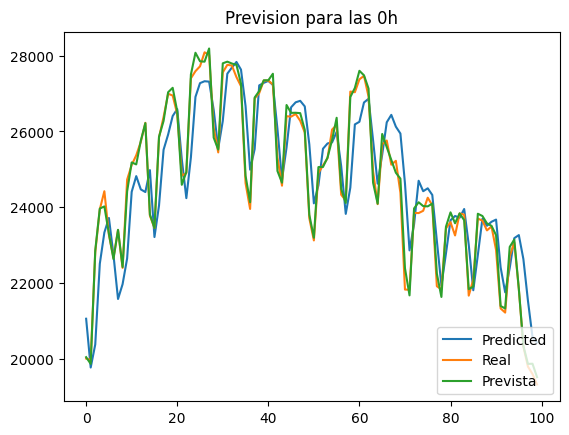

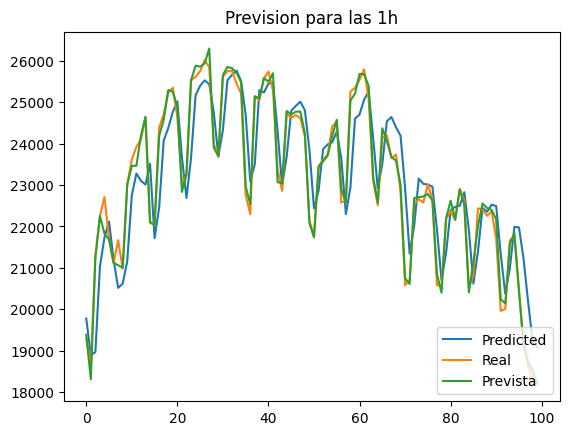

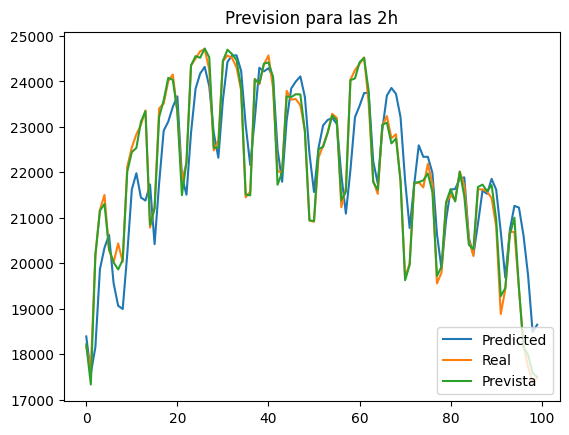

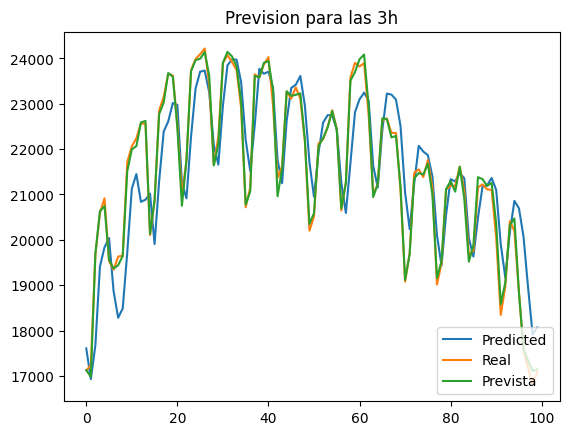

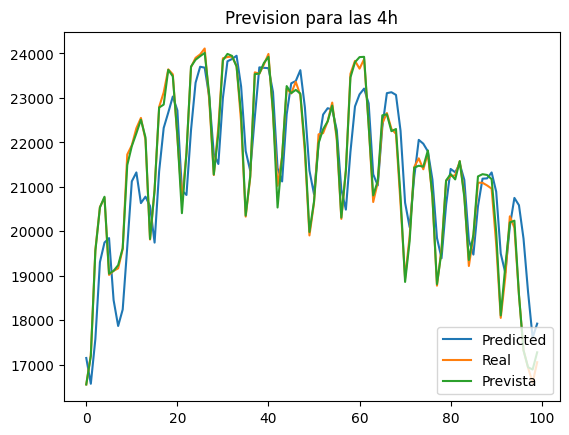

...

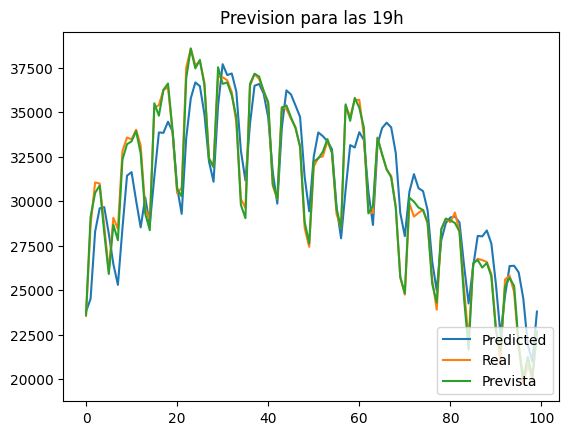

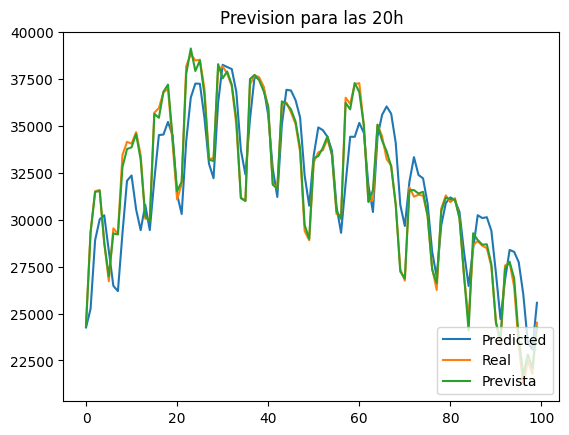

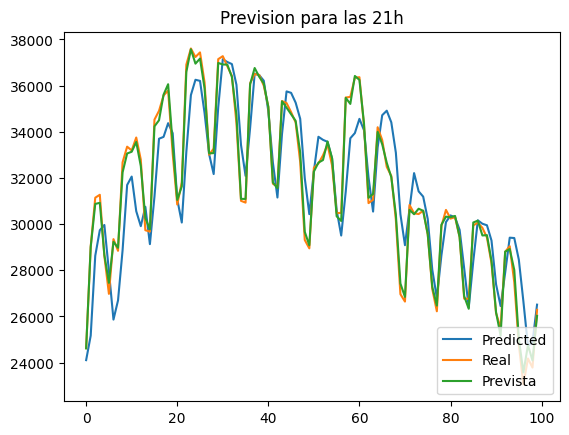

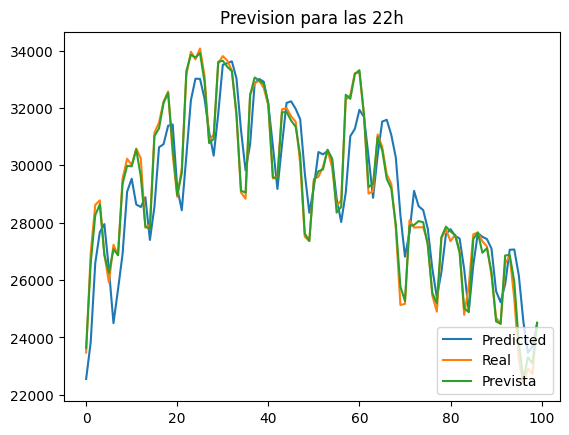

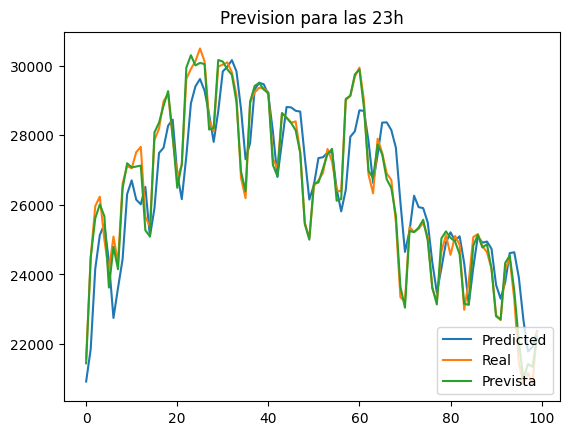

In [34]:
for h in range (24):
    plt.title ('Prevision para las ' + str(h) + 'h')
    plt.plot(NN_predictions_1[h][:100], label='Predicted')
    plt.plot(y_test[h][:100], label='Real')
    plt.plot(prevision_test[h][:100], label ='Prevista')
    plt.legend(loc='lower right')
    plt.show()

## Error Analysis

In [35]:
errors = {}
errors['Linear'] = linear_metrics
errors['XGBoost'] = XGB_metrics
errors['AutoReg'] = AR_metrics
errors['SkForecast'] = AR_XGB_metrics
errors['NN'] = NN_metrics

errors = pd.DataFrame (errors)

errors = errors.rename(index={0: 'RMSE', 1: 'MAE', 2:'MAPE', 3:'MAX'})

errors

,Linear,XGBoost,AutoReg,SkForecast,NN
RMSE,945.552000,856.240287,1263.455883,1229.162809,1613.571097
MAE,688.070427,639.522360,867.268005,854.513172,1172.243783
MAPE,2.605917,2.483575,3.352455,3.354531,4.456837
MAX,4266.874158,4040.234402,6735.019077,6677.446261,6633.742974


In [36]:
df_errors = {}
df_errors ['Linear'] = df_linear
df_errors ['XGBoost'] = df_XGB
df_errors ['AR'] = df_AR
df_errors ['Skforecast'] = df_AR_XGB
df_errors ['NN'] = df_NN

### Overall errors 

In [37]:
def hourly_error (type_of_error):
    errors_horas = {name:[] for name in df_errors.keys()}
    for name in errors_horas.keys():
        for i in range (24):
            auxdf = df_errors[name][df_errors[name]['Datetime'].dt.hour == i]
            if type_of_error == 'RMSE':
                errors_horas[name].append(np.sqrt(np.mean(auxdf['Squared Error'])))
            elif type_of_error == 'MAE':
                errors_horas[name].append(np.mean(auxdf['Absolute Error']))
            elif type_of_error == 'MAPE':
                errors_horas[name].append(np.mean(auxdf['Relative Error']))
            elif type_of_error == 'MAX':
                errors_horas[name].append(max(auxdf['Relative Error']))
            
    errors_horas = pd.DataFrame (errors_horas)
    plt.title(type_of_error + ' for different models')
    plt.xlabel('Hour')
    plt.plot(errors_horas, label=errors_horas.columns)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    return errors_horas

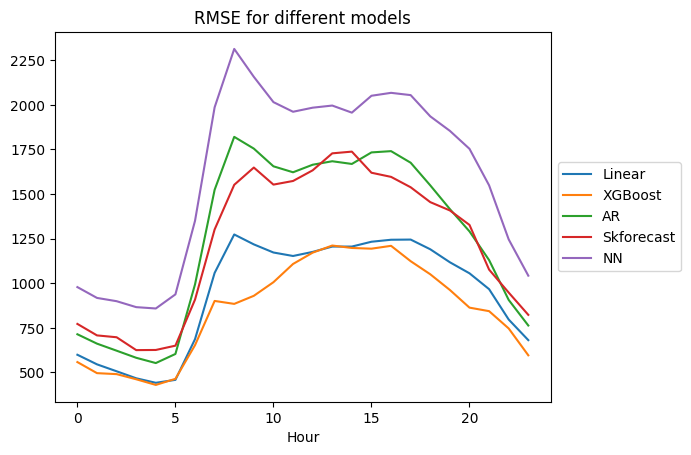

In [38]:
errors_horas_rmse = hourly_error ('RMSE')

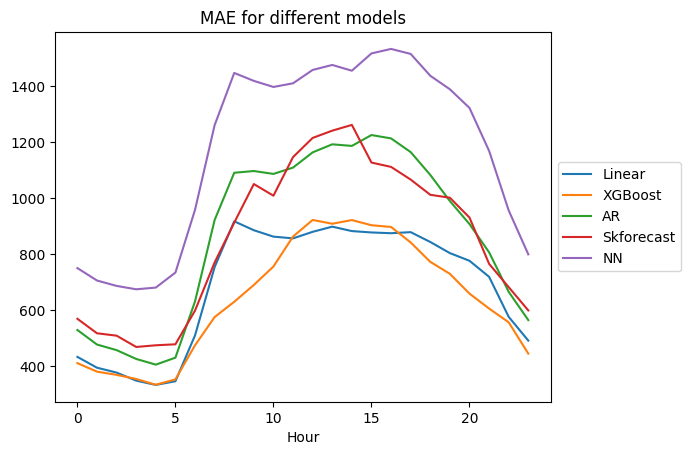

In [39]:
errors_horas_mae = hourly_error ('MAE')

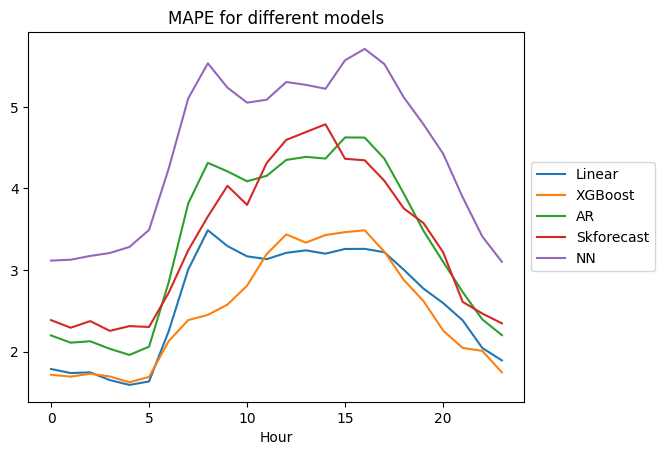

In [40]:
errors_horas_mape = hourly_error ('MAPE')

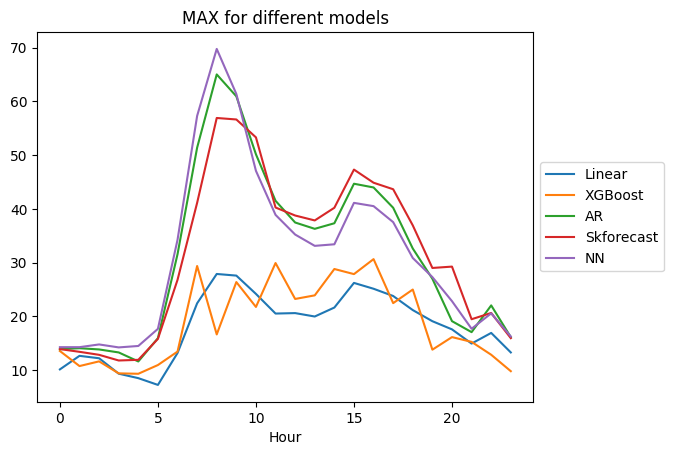

In [41]:
errors_horas_max = hourly_error ('MAX')

In [42]:
def weekly_error(type_of_error):
    errors_weekly = {name: [] for name in df_errors.keys()}
    for name in errors_weekly.keys():
        for i in range(7):
            auxdf = df_errors[name][df_errors[name]['Datetime'].dt.weekday == i]
            if type_of_error == 'RMSE':
                errors_weekly[name].append(np.sqrt(np.mean(auxdf['Squared Error'])))
            elif type_of_error == 'MAE':
                errors_weekly[name].append(np.mean(auxdf['Absolute Error']))
            elif type_of_error == 'MAPE':
                errors_weekly[name].append(np.mean(auxdf['Relative Error']))
            elif type_of_error == 'MAX':
                errors_weekly[name].append(max(auxdf['Absolute Error']))

    # Plot each set of errors separately
    for name, errors in errors_weekly.items():
        plt.plot(range(7), errors, label=name)  # Assuming 0-6 corresponds to Monday-Sunday
        
    plt.title(type_of_error + ' for different models')
    plt.xlabel('Day of the week')
    plt.xticks(range(7), ['L', 'M', 'X', 'J', 'V', 'S', 'D'])
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

    errors_weekly = pd.DataFrame(errors_weekly)
    return errors_weekly

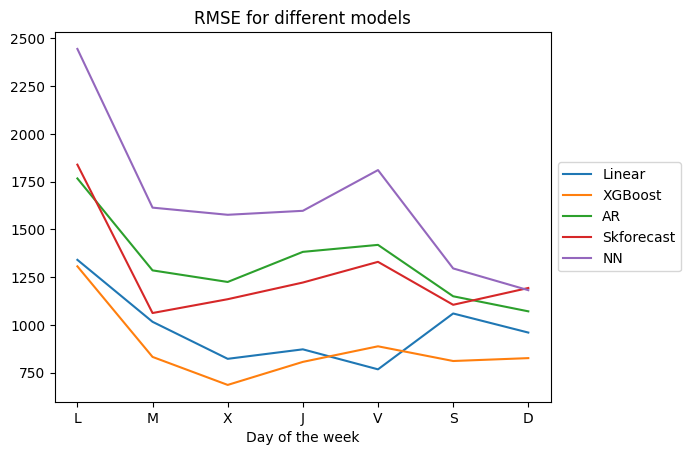

In [43]:
errors_weekly_rmse = weekly_error ('RMSE')

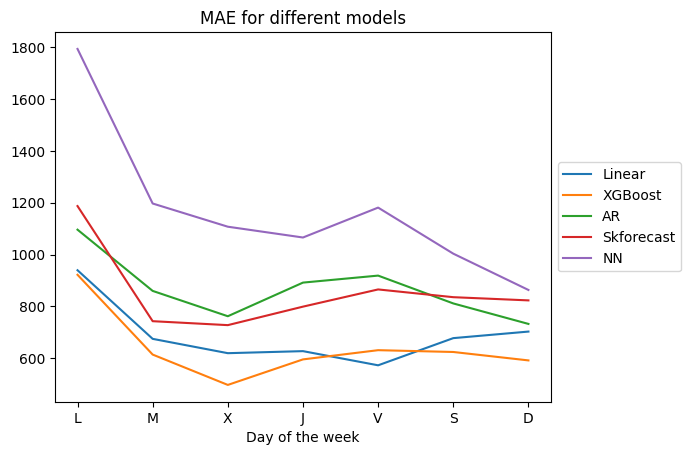

In [44]:
errors_weekly_mae = weekly_error ('MAE')

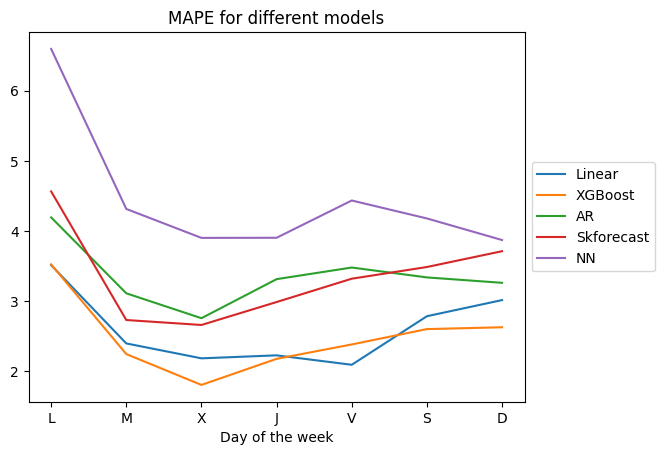

In [45]:
errors_weekly_mape = weekly_error ('MAPE')

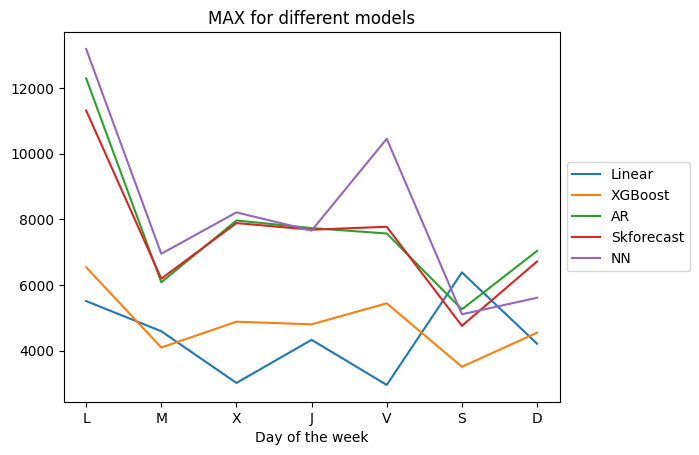

In [46]:
errors_weekly_max = weekly_error ('MAX')

## Histograms

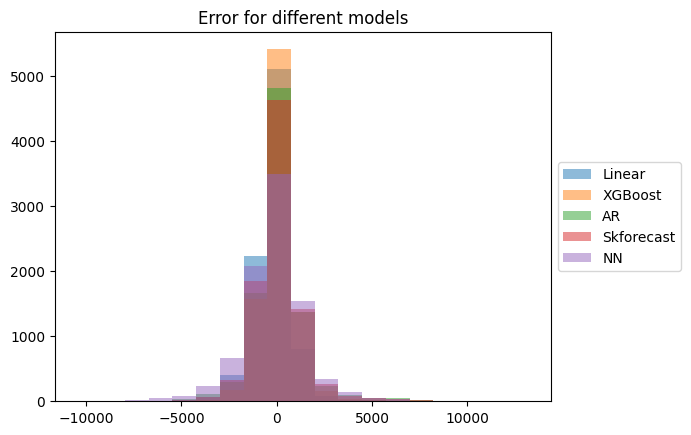

In [47]:
nbins = int (np.sqrt(len(y_test[0])))
# print (nbins)

for name in df_errors.keys():
    max_value = 0
    min_value = 0
    if max(df_errors[name]['Error']) >= max_value:
        max_value = max(df_errors[name]['Error'])
    if min(df_errors[name]['Error']) <= min_value:
        min_value = min(df_errors[name]['Error'])
bin_edges = np.linspace(min_value, max_value, nbins + 1)

plt.title('Error for different models')
for name in df_errors.keys():
    plt.hist(df_errors[name]['Error'], bins = bin_edges, label=name, alpha=0.5)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [48]:
variables = ['mean', 'sigma', 'mean+-1sigma', 'mean+-2sigma', 'mean+-3sigma', 'mean+-4sigma']
nsigmas = 4

error_stats = pd.DataFrame()

for name in df_errors.keys():
    aux = []
    length = len(df_errors[name])
    mean = np.mean(df_errors[name]['Error'])
    aux.append(mean)
    sigma = np.std(df_errors[name]['Error'])
    aux.append(sigma)
    for n in range(1,nsigmas+1):
        auxdf = df_errors[name][(df_errors[name]['Error']>=mean-n*sigma) & (df_errors[name]['Error']<=mean+n*sigma)]
        aux.append(len(auxdf)/length)
    error_stats [name] = aux

error_stats.index = variables
error_stats

    

,Linear,XGBoost,AR,Skforecast,NN
mean,-218.817073,93.440438,108.689078,105.757178,-119.195178
sigma,968.236301,893.153734,1340.130938,1288.462933,1683.779160
mean+-1sigma,0.776027,0.759817,0.819749,0.795320,0.784361
mean+-2sigma,0.946005,0.949429,0.944292,0.951142,0.940639
mean+-3sigma,0.984589,0.986530,0.977283,0.980822,0.980137
mean+-4sigma,0.991895,0.995434,0.990411,0.991324,0.994635


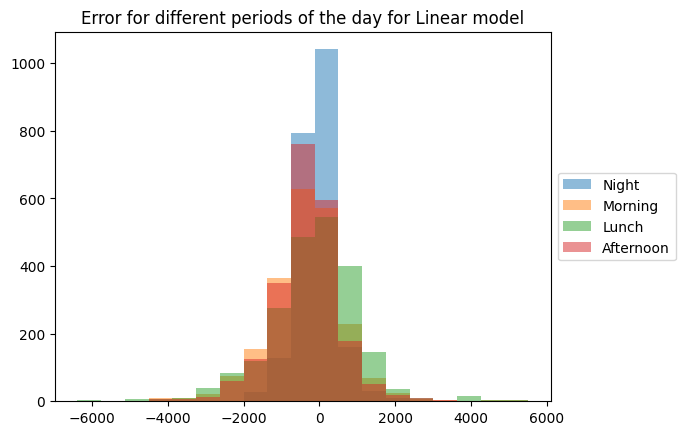

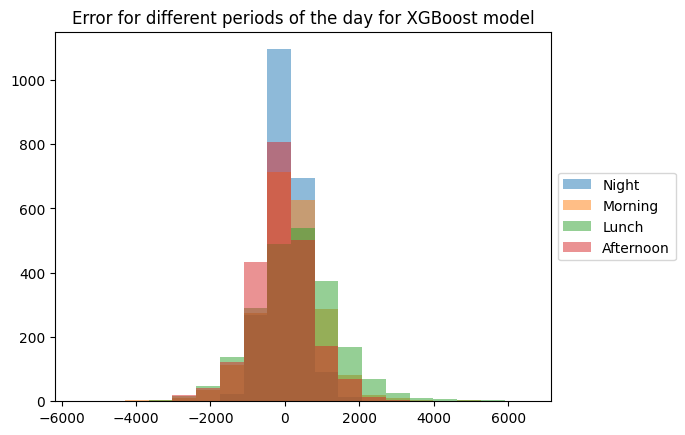

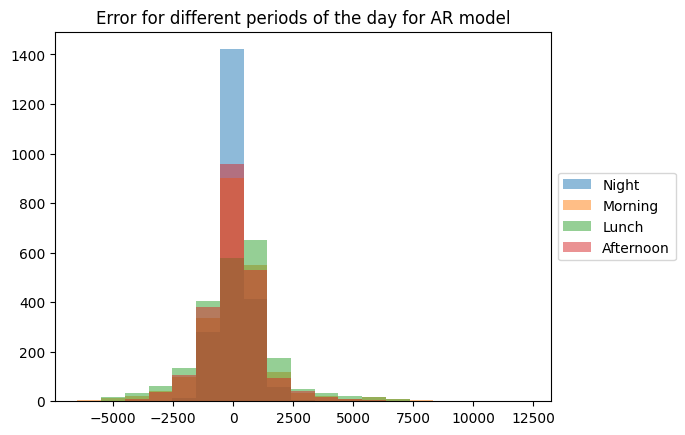

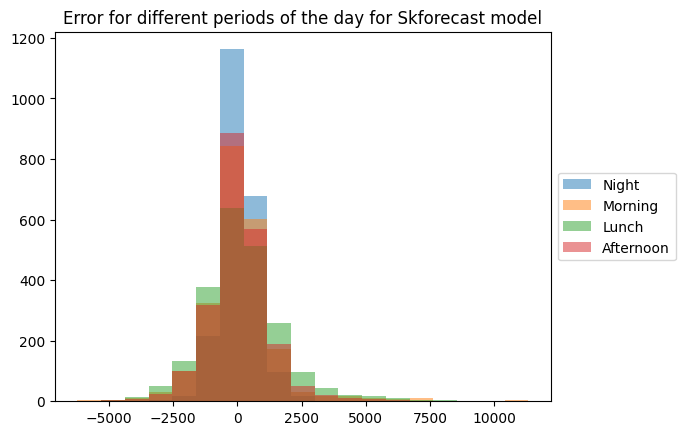

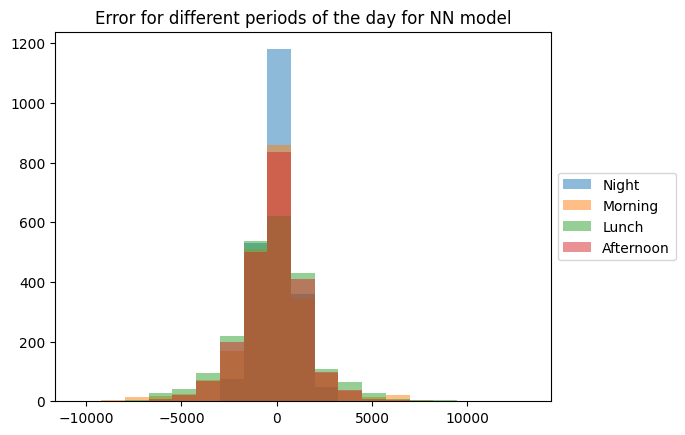

In [49]:
day_division = {
    'Night': [x for x in range (6)],
    'Morning': [x for x in range (6,12)],
    'Lunch': [x for x in range (12, 18)],
    'Afternoon': [x for x in range (18,24)]
    
}

nbins = int (np.sqrt(len(y_test[0])))
# print (nbins)

for name in df_errors.keys():
    plt.title('Error for different periods of the day for '+name+' model')
    max_value = 0
    min_value = 0
    for period in day_division.keys():
        auxdf = df_errors[name][df_errors[name]['Datetime'].dt.hour.isin(day_division[period])]
        if max(auxdf['Error']) >= max_value:
            max_value = max(auxdf['Error'])
        if min(auxdf['Error']) <= min_value:
            min_value = min(auxdf['Error'])
    bin_edges = np.linspace(min_value, max_value, nbins + 1)
    for period in day_division.keys():
        auxdf = df_errors[name][df_errors[name]['Datetime'].dt.hour.isin(day_division[period])]
        plt.hist(auxdf['Error'], bins = bin_edges, label=period, alpha=0.5)
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()